In [1]:
import os
import random
import time
import csv

import numpy as np

import torch
import torchvision

from PIL import Image
import cv2


%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from IPython import display


from torch.autograd import Variable
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

import transforms as T

from engine import train_one_epoch, evaluate
import utils
import glob

%load_ext autoreload
%autoreload 2

# from torchvision import transforms
# transform = transforms.Compose([transforms.ToTensor()])  # Convert image to PyTorch Tensor
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')


# Load the finetuned model from the previous section

In [3]:
def get_model_instance_segmentation(num_classes):
    # load an instance segmentation model pre-trained pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)

    return model

In [4]:
model = get_model_instance_segmentation(num_classes=2)
state_dict = torch.load('finetuned_better_2.pt')
model.load_state_dict(state_dict)
# move model to the right device
model.to(device)
model.eval()

MaskRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(original_name=FrozenBatchNorm2d)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(original_name=FrozenBatchNorm2d)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(original_name=FrozenBatchNorm2d)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(original_name=FrozenBatchNorm2d)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
         

In [5]:
# Helper functions to draw predictions:

import torchvision.transforms as T
def get_mask_rcnn_result(frame, frame_count, threshold=0.5, rect_th=3, text_size=3, text_th=3):
    masks, boxes, pred_cls = get_prediction(frame, threshold)
    img = cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)
    for i in range(len(masks)):
        rgb_mask = random_colour_masks(masks[i], i)
        img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)
        cv2.rectangle(img, boxes[i][0], boxes[i][1],color=(0, 255, 0), thickness=rect_th)
    name = '{0}.jpg'.format(frame_count)
    name = os.path.join("./egohands/vid_save", name)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    cv2.imwrite(name, img)

def random_colour_masks(image, i):
    colours = [[0, 255, 0],[0, 0, 255],[255, 0, 0],[0, 255, 255],[255, 255, 0],[255, 0, 255],[80, 70, 180],[250, 80, 190],[245, 145, 50],[70, 150, 250],[50, 190, 190]]
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)
    r[image == 1], g[image == 1], b[image == 1] = colours[i]
    coloured_mask = np.stack([r, g, b], axis=2)
    return coloured_mask

def get_prediction(frame, threshold):
    cv2_im = cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)
    pil_im = Image.fromarray(cv2_im)
    transform = T.Compose([T.ToTensor()])
    img = transform(pil_im)
    pred = model([img.to(device)])
    pred_score = list(pred[0]['scores'].detach().cpu().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x>threshold][-1]
    masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()
    pred_class = [i for i in list(pred[0]['labels'].cpu().numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().cpu().numpy())]
    masks = masks[:pred_t+1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]  
    return masks, pred_boxes, pred_class

# Choosing a video randomly to run the inference on

In [6]:
capture = cv2.VideoCapture(os.path.join("./egohands", 'cards_office_B_S.mp4'))

## Run inference sequentially on frames and store them in a folder

In [7]:
frame_count = 0
import torchvision.transforms as T
transform = T.Compose([T.ToTensor()])
while True:
    ret, frame = capture.read()
    # Bail out when the video file ends
    if not ret:
        break        
    try:
        get_mask_rcnn_result(frame, frame_count, threshold=0.7)
    except Exception:
        pass
    frame_count += 1

# Create video using VideoWriter from the stored frames

In [8]:
images = list(glob.iglob(os.path.join("./egohands/vid_save", '*.*')))

In [9]:
images = sorted(images, key=lambda x: float(os.path.split(x)[1][:-3]))

In [10]:
def make_video(images, outimg=None, fps=5, size=None,
               is_color=True, format="XVID"):
    """
    Create a video from a list of images.
 
    @param      outvid      output video
    @param      images      list of images to use in the video
    @param      fps         frame per second
    @param      size        size of each frame
    @param      is_color    color
    @param      format      see http://www.fourcc.org/codecs.php
    @return                 see http://opencv-python-tutroals.readthedocs.org/en/latest/py_tutorials/py_gui/py_video_display/py_video_display.html
 
    The function relies on http://opencv-python-tutroals.readthedocs.org/en/latest/.
    By default, the video will have the size of the first image.
    It will resize every image to this size before adding them to the video.
    """
    from cv2 import VideoWriter, VideoWriter_fourcc, imread, resize
    fourcc = VideoWriter_fourcc(*format)
    vid = None
    for image in images:
        if not os.path.exists(image):
            raise FileNotFoundError(image)
        img = imread(image)
        if vid is None:
            if size is None:
                size = img.shape[1], img.shape[0]
            vid = VideoWriter(outvid, fourcc, float(fps), size, is_color)
        if size[0] != img.shape[1] and size[1] != img.shape[0]:
            img = resize(img, size)
        vid.write(img)
    vid.release()
    return vid

outvid = os.path.join(".", "out.mp4")
make_video(images, outvid, fps=30)

<VideoWriter 0x2b9e8fc81810>

# I'm unable to play the video on the Jupyter notebook itself due to some MIME format issues, so I'll be attaching the video as an attachment to the email as "out.mp4"

## Although I'm showing a clipped GIF of the output here 

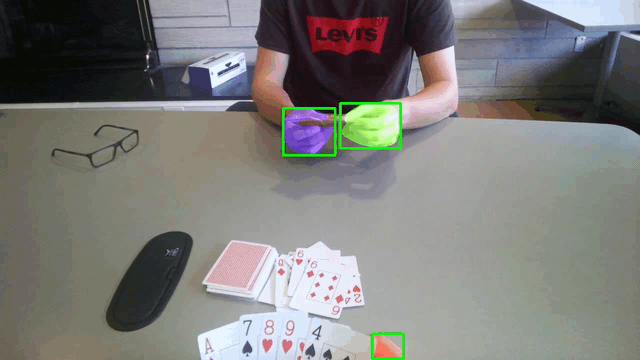

In [12]:
from IPython.display import Image

Image("out.gif")